In [1]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import e3nn
from e3nn import o3, io
import numpy as np
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import open3d as o3d
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from tqdm.notebook import tqdm
from functools import partial, reduce


device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/cuda/__init__.py:118: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:108.)
  return torch._C._cuda_getDeviceCount() > 0


'cpu'

In [2]:
from data_generation import SimpleShapeDataset, SimpleShapeUniformRayDataset

dataset = SimpleShapeUniformRayDataset(sample_points=20000)

data = next(iter(DataLoader(dataset, batch_size=1))).float()

In [3]:
# how does it look like in spherical harmonics?

sphten = io.SphericalTensor(11, 1, 1)
signal = o3.spherical_harmonics(sphten, x=data, normalize=False).mean(dim=[0, 1])

fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
# fig.add_trace(go.Scatter3d(x=0.12 * data[0, :, 0], y=0.12 * data[0, :, 1], z=0.12 * data[0, :, 2]), row=1, col=2)
fig.add_trace(go.Surface(sphten.plotly_surface(signal, radius=True)[0]), row=1, col=2)
fig.add_trace(go.Scatter3d(x=data[0, :, 0], y=data[0, :, 1], z=data[0, :, 2]), row=1, col=1)

In [89]:
# # o3.FullyConnectedTensorProduct(irreps_in1=o3.Irreps('30e'), irreps_in2=o3.Irreps('30e'), irreps_out=o3.Irreps('30e'))
# sphten = io.SphericalTensor(lmax=14, p_val=1, p_arg=1)
# 
# o3.spherical_harmonics(l=sphten, x=sphten.randn(-1), normalize=False)

NotImplementedError: spherical_harmonics maximum l implemented is 11, send us an email to ask for more

In [70]:
class EncoderDecoder(nn.Module):
    def __init__(self):
        super(EncoderDecoder, self).__init__()
        
        self.irrep_layer = []
        tw = 1
        lmax = 5
        for l in range(lmax, 0, -1): # last one sould be lmax=1
            irreps = io.SphericalTensor(lmax=l, p_arg=1, p_val=1)
            irreps = irreps * tw
            irreps = (irreps.sort())[0]
            irreps = irreps.simplify()
            self.irrep_layer.append(irreps)
            tw *= 2
        
        # simplifying the network to avoid vanishing gradient?
        self.enc_tp1 = o3.FullyConnectedTensorProduct(irreps_in1=model.irrep_layer[0], irreps_in2=model.irrep_layer[0], irreps_out=model.irrep_layer[-3])
        self.norm_layer_enc1 = e3nn.nn.BatchNorm(irreps=model.irrep_layer[-3])
        self.enc_tp2 = o3.FullyConnectedTensorProduct(irreps_in1=model.irrep_layer[-3], irreps_in2=model.irrep_layer[-3], irreps_out=model.irrep_layer[-2])
        self.norm_layer_enc2 = e3nn.nn.BatchNorm(irreps=model.irrep_layer[-2])
        self.enc_tp3 = o3.FullyConnectedTensorProduct(irreps_in1=model.irrep_layer[-2], irreps_in2=model.irrep_layer[-2], irreps_out=model.irrep_layer[-1])
        self.encoder_layers = [self.enc_tp1, self.norm_layer_enc1, self.enc_tp2, self.norm_layer_enc2, self.enc_tp3]
        self.dec_tp1 = o3.FullyConnectedTensorProduct(irreps_in1=model.irrep_layer[-1], irreps_in2=model.irrep_layer[-1], irreps_out=model.irrep_layer[-2])
        self.norm_layer_dec1 = e3nn.nn.BatchNorm(irreps=model.irrep_layer[-2])
        self.dec_tp2 = o3.FullyConnectedTensorProduct(irreps_in1=model.irrep_layer[-2], irreps_in2=model.irrep_layer[-2], irreps_out=model.irrep_layer[-3])
        self.norm_layer_dec2 = e3nn.nn.BatchNorm(irreps=model.irrep_layer[-3])
        self.dec_tp3 = o3.FullyConnectedTensorProduct(irreps_in1=model.irrep_layer[-3], irreps_in2=model.irrep_layer[-3], irreps_out=model.irrep_layer[0])
        self.decoder_layers = [self.dec_tp1, self.norm_layer_dec1, self.dec_tp2, self.norm_layer_dec2, self.dec_tp3]

        # # todo for some reason if you just define tp in a loop, the parameters would not get detected!
        # define_enc = lambda i: o3.FullyConnectedTensorProduct(irreps_in1=self.irrep_layer[i], irreps_in2=self.irrep_layer[i], irreps_out=self.irrep_layer[i+1])
        # define_dec = lambda i: o3.FullyConnectedTensorProduct(irreps_in1=self.irrep_layer[lmax-1-i], irreps_in2=self.irrep_layer[lmax-1-i], irreps_out=self.irrep_layer[lmax-2-i])
        # 
        # assert(len(self.irrep_layer) == lmax)
        # 
        # self.enc0 = define_enc(0)
        # self.enc1 = define_enc(1)
        # self.enc2 = define_enc(2)
        # self.enc3 = define_enc(3)
        # # self.enc4 = define_enc(4)
        # # self.enc5 = define_enc(5)
        # 
        # self.dec0 = define_dec(0)
        # self.dec1 = define_dec(1)
        # self.dec2 = define_dec(2)
        # self.dec3 = define_dec(3)
        # # self.dec4 = define_dec(4)
        # # self.dec5 = define_dec(5)
        # 
        # # self.encoder_layers = [self.enc0, self.enc1, self.enc2, self.enc3, self.enc4, self.enc5]
        # # self.decoder_layers = [self.dec0, self.dec1, self.dec2, self.dec3, self.dec4, self.dec5]
        # self.encoder_layers = [self.enc0, self.enc1, self.enc2, self.enc3]
        # self.decoder_layers = [self.dec0, self.dec1, self.dec2, self.dec3]





        # todo use fully connected tensor product?
        # self.encoder_layers = [
        #     o3.FullyConnectedTensorProduct(
        #         irreps_in1=self.irrep_layer[i],
        #         irreps_in2=self.irrep_layer[i],
        #         irreps_out=self.irrep_layer[i+1],
        #     )
        #     for i in range(len(self.irrep_layer)-1)
        # ]

        # todo is the information bottleneck limited enough?
        
        # self.decoder_layers = [
        #     o3.FullyConnectedTensorProduct(
        #         irreps_in1=self.irrep_layer[i+1],
        #         irreps_in2=self.irrep_layer[i+1],
        #         irreps_out=self.irrep_layer[i],
        #     )
        #     for i in range(len(self.irrep_layer)-2, -1, -1)            
        # ]

    def forward(self, points):
        inp = o3.spherical_harmonics(l=self.irrep_layer[0], x=points, normalize=False).mean(dim=1) # todo fix the normalization later
        latent = inp
        for layer in self.encoder_layers:
            # todo ugly code. change later
            if isinstance(layer, e3nn.nn.BatchNorm):
                latent = layer(latent)
            else:
                latent = layer(latent, latent)        
        out = latent
        for layer in self.decoder_layers:
            # todo ugly code. change later
            if isinstance(layer, e3nn.nn.BatchNorm):
                out = layer(out)
            else:
                out = layer(out, out)
        return inp, latent, out
    
    # def forward(self, data) -> torch.Tensor:
    #     num_neighbors = 2  # typical number of neighbors
    #     num_nodes = 4  # typical number of nodes
    # 
    #     edge_src, edge_dst = radius_graph(x=data.pos, r=1.1, batch=data.batch)  # tensors of indices representing the graph
    #     edge_vec = data.pos[edge_src] - data.pos[edge_dst]
    #     edge_sh = o3.spherical_harmonics(
    #         l=self.irreps_sh,
    #         x=edge_vec,
    #         normalize=False,  # here we don't normalize otherwise it would not be a polynomial
    #         normalization="component",
    #     )
    # 
    #     # For each node, the initial features are the sum of the spherical harmonics of the neighbors
    #     node_features = scatter(edge_sh, edge_dst, dim=0).div(num_neighbors**0.5)
    # 
    #     # For each edge, tensor product the features on the source node with the spherical harmonics
    #     edge_features = self.tp1(node_features[edge_src], edge_sh)
    #     node_features = scatter(edge_features, edge_dst, dim=0).div(num_neighbors**0.5)
    # 
    #     edge_features = self.tp2(node_features[edge_src], edge_sh)
    #     node_features = scatter(edge_features, edge_dst, dim=0).div(num_neighbors**0.5)
    # 
    #     # For each graph, all the node's features are summed
    #     return scatter(node_features, data.batch, dim=0).div(num_nodes**0.5)

print("number of parameters = ", sum([np.prod(x.shape) for x in EncoderDecoder().parameters()]))

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs

number of parameters =  30240


/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.



/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.

/home/shayan/miniconda3/envs

  0%|          | 0/100 [00:00<?, ?it/s]

/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:454: UserWarning:

To get the last learning rate computed by the scheduler, please use `get_last_lr()`.



gradient 23.56232452392578
gradient 0.003296040231361985
gradient 0.6198748350143433
gradient 0.17178189754486084
gradient 0.16604039072990417
gradient 0.3340076506137848
gradient 0.4111318290233612
gradient 0.23480573296546936
gradient 0.15666602551937103
gradient 0.17592889070510864
gradient 0.22553901374340057
gradient 0.03818659111857414
gradient 0.06766749173402786
gradient 0.09010271728038788
gradient 0.18654784560203552
gradient 0.0945688858628273
gradient 0.1437770426273346
gradient 0.08205456286668777
gradient 0.11289343237876892
gradient 0.07444672286510468
gradient 0.05667369067668915
gradient 0.06128771975636482
gradient 0.03805956989526749
gradient 0.030804185196757317
gradient 0.025742093101143837
gradient 0.027740921825170517
gradient 0.027268631383776665
gradient 0.020884573459625244
gradient 0.017403455451130867
gradient 0.014062341302633286
gradient 0.009213988669216633
gradient 0.005421880166977644
gradient 0.010078541934490204
gradient 0.0147788031026721
gradient 0.

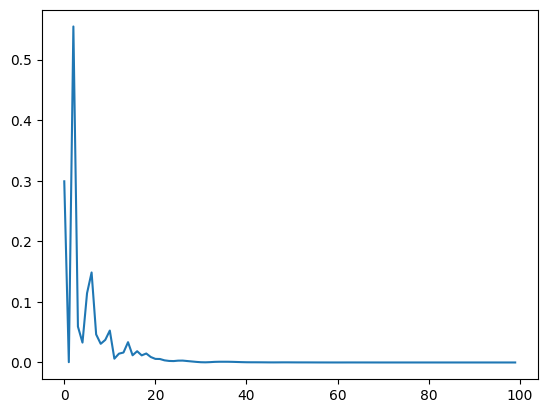

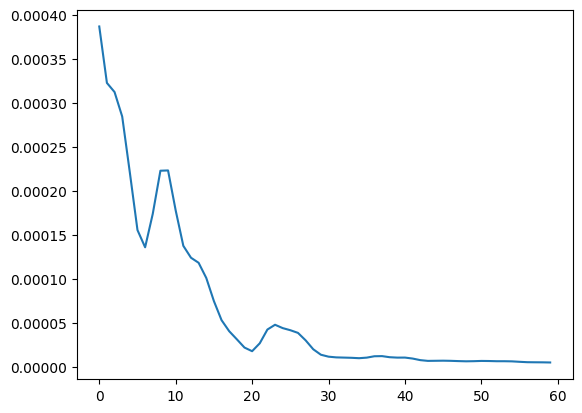

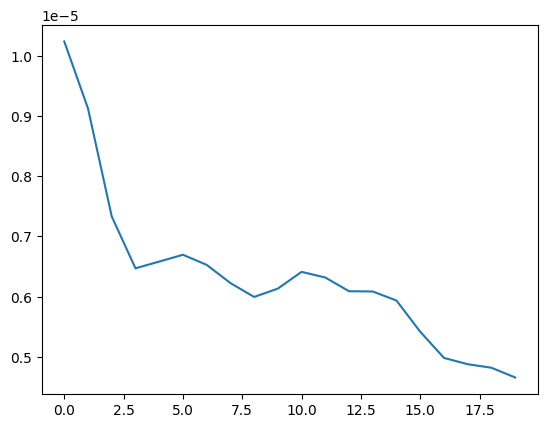

In [79]:
epochs = 100

dataset = SimpleShapeUniformRayDataset(sample_points=20000)
model = EncoderDecoder().to(device) # lmax=7
optimizer = torch.optim.Adam(model.parameters(), lr=1)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[40, 80], gamma=1) # todo interesting apparently you shouldn't change rl
loss_fn = torch.nn.HuberLoss(reduction='mean')

dataloader = DataLoader(dataset, batch_size=len(dataset))
# single_data = next(iter(dataloader)).float().to(device)

pbar = tqdm(range(epochs))
losses = []
for i in pbar:
    for data in dataloader:
        data = data.float().to(device)
        inp, latent, out = model(data)
        loss = loss_fn(inp, out)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        print('gradient', max([torch.max(torch.linalg.norm(p.grad)).item() for p in model.parameters()]))
        pbar.set_description(f'Epoch {i+1} Loss: {loss.item():.8f} Lr={scheduler.get_lr()[0]}')
        losses.append(loss.item())
    scheduler.step()

plt.plot(losses)
plt.figure()
plt.plot(losses[40:])
plt.figure()
plt.plot(losses[80:])

In [81]:
single_data = next(iter(dataloader)).float().to(device)

inp, latent, out = model(single_data)
inp = inp.cpu().detach()
latent = latent.cpu().detach()
out = out.cpu().detach()

lmax = 5 # fixed for this spherical tensor
sphten = io.SphericalTensor(lmax, 1, 1)
fig = make_subplots(rows=1, cols=2, specs=[[{'is_3d': True} for j in range(2)] for i in range(1)])
fig.add_trace(go.Surface(sphten.plotly_surface(out, radius=True)[0]), row=1, col=1)
fig.add_trace(go.Surface(sphten.plotly_surface(inp, radius=True)[0]), row=1, col=2)

In [33]:
out

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [67]:
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.tp = o3.FullyConnectedTensorProduct(irreps_in1=o3.Irreps("0e"), irreps_in2=o3.Irreps("0e"), irreps_out=o3.Irreps("0e"))

    def forward(self, x):
        return self.tp(x, x)

model = MyModel()

list(model.parameters())

a = torch.tensor([10], requires_grad=True, dtype=torch.float32)
loss = model(a)
print(loss)
print([p.grad for p in model.parameters()])
loss.backward()
print([p.grad for p in model.parameters()])

tensor([-115.4574], grad_fn=<ViewBackward0>)
[None]
[tensor([100.])]


/home/shayan/miniconda3/envs/equiv-net/lib/python3.10/site-packages/torch/jit/_check.py:177: UserWarning:

The TorchScript type system doesn't support instance-level annotations on empty non-base types in `__init__`. Instead, either 1) use a type annotation in the class body, or 2) wrap the type in `torch.jit.Attribute`.



In [ ]:
"""Minimal example

Implement a equivariant polynomial to fit the tetris dataset
Exact equivariance to :math:`E(3)`

This example is minimal:

* there is dependency on the distance to the neighbors (tetris pieces are made of edges of length 1)
* there is no non-linearities except that the tensor product, therefore this model is a polynomial

>>> test()
"""
import logging

import torch
from torch_cluster import radius_graph
from torch_geometric.data import Data, DataLoader
from torch_scatter import scatter

from e3nn import o3
from e3nn.o3 import FullyConnectedTensorProduct
from e3nn.util.test import assert_equivariant


def tetris():
    pos = [
        [(0, 0, 0), (0, 0, 1), (1, 0, 0), (1, 1, 0)],  # chiral_shape_1
        [(0, 0, 0), (0, 0, 1), (1, 0, 0), (1, -1, 0)],  # chiral_shape_2
        [(0, 0, 0), (1, 0, 0), (0, 1, 0), (1, 1, 0)],  # square
        [(0, 0, 0), (0, 0, 1), (0, 0, 2), (0, 0, 3)],  # line
        [(0, 0, 0), (0, 0, 1), (0, 1, 0), (1, 0, 0)],  # corner
        [(0, 0, 0), (0, 0, 1), (0, 0, 2), (0, 1, 0)],  # L
        [(0, 0, 0), (0, 0, 1), (0, 0, 2), (0, 1, 1)],  # T
        [(0, 0, 0), (1, 0, 0), (1, 1, 0), (2, 1, 0)],  # zigzag
    ]
    pos = torch.tensor(pos, dtype=torch.get_default_dtype())

    # Since chiral shapes are the mirror of one another we need an *odd* scalar to distinguish them
    labels = torch.tensor(
        [
            [+1, 0, 0, 0, 0, 0, 0],  # chiral_shape_1
            [-1, 0, 0, 0, 0, 0, 0],  # chiral_shape_2
            [0, 1, 0, 0, 0, 0, 0],  # square
            [0, 0, 1, 0, 0, 0, 0],  # line
            [0, 0, 0, 1, 0, 0, 0],  # corner
            [0, 0, 0, 0, 1, 0, 0],  # L
            [0, 0, 0, 0, 0, 1, 0],  # T
            [0, 0, 0, 0, 0, 0, 1],  # zigzag
        ],
        dtype=torch.get_default_dtype(),
    )

    # apply random rotation
    pos = torch.einsum("zij,zaj->zai", o3.rand_matrix(len(pos)), pos)

    # put in torch_geometric format
    dataset = [Data(pos=pos) for pos in pos]
    data = next(iter(DataLoader(dataset, batch_size=len(dataset))))

    return data, labels


class InvariantPolynomial(torch.nn.Module):
    def __init__(self) -> None:
        super().__init__()
        self.irreps_sh: o3.Irreps = o3.Irreps.spherical_harmonics(3)
        irreps_mid = o3.Irreps("64x0e + 24x1e + 24x1o + 16x2e + 16x2o")
        irreps_out = o3.Irreps("0o + 6x0e")

        self.tp1 = FullyConnectedTensorProduct(
            irreps_in1=self.irreps_sh,
            irreps_in2=self.irreps_sh,
            irreps_out=irreps_mid,
        )
        self.tp2 = FullyConnectedTensorProduct(
            irreps_in1=irreps_mid,
            irreps_in2=self.irreps_sh,
            irreps_out=irreps_out,
        )
        self.irreps_out = self.tp2.irreps_out

    def forward(self, data) -> torch.Tensor:
        num_neighbors = 2  # typical number of neighbors
        num_nodes = 4  # typical number of nodes

        edge_src, edge_dst = radius_graph(x=data.pos, r=1.1, batch=data.batch)  # tensors of indices representing the graph
        edge_vec = data.pos[edge_src] - data.pos[edge_dst]
        edge_sh = o3.spherical_harmonics(
            l=self.irreps_sh,
            x=edge_vec,
            normalize=False,  # here we don't normalize otherwise it would not be a polynomial
            normalization="component",
        )

        # For each node, the initial features are the sum of the spherical harmonics of the neighbors
        node_features = scatter(edge_sh, edge_dst, dim=0).div(num_neighbors**0.5)

        # For each edge, tensor product the features on the source node with the spherical harmonics
        edge_features = self.tp1(node_features[edge_src], edge_sh)
        node_features = scatter(edge_features, edge_dst, dim=0).div(num_neighbors**0.5)

        edge_features = self.tp2(node_features[edge_src], edge_sh)
        node_features = scatter(edge_features, edge_dst, dim=0).div(num_neighbors**0.5)

        # For each graph, all the node's features are summed
        return scatter(node_features, data.batch, dim=0).div(num_nodes**0.5)


def main() -> None:
    data, labels = tetris()
    f = InvariantPolynomial()

    optim = torch.optim.Adam(f.parameters(), lr=1e-2)

    # == Train ==
    for step in range(200):
        pred = f(data)
        loss = (pred - labels).pow(2).sum()

        optim.zero_grad()
        loss.backward()
        optim.step()

        if step % 10 == 0:
            accuracy = pred.round().eq(labels).all(dim=1).double().mean(dim=0).item()
            print(f"epoch {step:5d} | loss {loss:<10.1f} | {100 * accuracy:5.1f}% accuracy")

    # == Check equivariance ==
    # Because the model outputs (psuedo)scalars, we can easily directly
    # check its equivariance to the same data with new rotations:
    print("Testing equivariance directly...")
    rotated_data, _ = tetris()
    error = f(rotated_data) - f(data)
    print(f"Equivariance error = {error.abs().max().item():.1e}")

    print("Testing equivariance using `assert_equivariance`...")
    # We can also use the library's `assert_equivariant` helper
    # `assert_equivariant` also tests parity and translation, and
    # can handle non-(psuedo)scalar outputs.
    # To "interpret" between it and torch_geometric, we use a small wrapper:

    def wrapper(pos, batch):
        return f(Data(pos=pos, batch=batch))

    # `assert_equivariant` uses logging to print a summary of the equivariance error,
    # so we enable logging
    logging.basicConfig(level=logging.INFO)
    assert_equivariant(
        wrapper,
        # We provide the original data that `assert_equivariant` will transform...
        args_in=[data.pos, data.batch],
        # ...in accordance with these irreps...
        irreps_in=[
            "cartesian_points",  # pos has vector 1o irreps, but is also translation equivariant
            None,  # `None` indicates invariant, possibly non-floating-point data
        ],
        # ...and confirm that the outputs transform correspondingly for these irreps:
        irreps_out=[f.irreps_out],
    )


if __name__ == "__main__":
    main()


def test() -> None:
    data, labels = tetris()
    f = InvariantPolynomial()

    pred = f(data)
    loss = (pred - labels).pow(2).sum()
    loss.backward()

    rotated_data, _ = tetris()
    error = f(rotated_data) - f(data)
    assert error.abs().max() < 1e-5